# How to Train YOLOv5 on Custom Objects

This tutorial is based on the [YOLOv5 repository](https://github.com/ultralytics/yolov5) by [Ultralytics](https://www.ultralytics.com/). This notebook shows training on **your own custom objects**. Many thanks to Ultralytics for putting this repository together - we hope that in combination with clean data management tools at Roboflow, this technologoy will become easily accessible to any developer wishing to use computer vision in their projects.

### Accompanying Blog Post

We recommend that you follow along in this notebook while reading the blog post on [how to train YOLOv5](https://blog.roboflow.ai/how-to-train-yolov5-on-a-custom-dataset/), concurrently.

### Steps Covered in this Tutorial

In this tutorial, we will walk through the steps required to train YOLOv5 on your custom objects. We use a [public blood cell detection dataset](https://public.roboflow.ai/object-detection/bccd), which is open source and free to use. You can also use this notebook on your own data.

To train our detector we take the following steps:

* Install YOLOv5 dependencies
* Download custom YOLOv5 object detection data
* Write our YOLOv5 Training configuration
* Run YOLOv5 training
* Evaluate YOLOv5 performance
* Visualize YOLOv5 training data
* Run YOLOv5 inference on test images
* Export saved YOLOv5 weights for future inference



### **About**

[Roboflow](https://roboflow.com) enables teams to deploy custom computer vision models quickly and accurately. Convert data from to annotation format, assess dataset health, preprocess, augment, and more. It's free for your first 1000 source images.

**Looking for a vision model available via API without hassle? Try Roboflow Train.**

![Roboflow Wordmark](https://i.imgur.com/dcLNMhV.png)



In [1]:
%cd C:\Users\manju\Desktop\ml-project

C:\Users\manju\Desktop\ml-project


#Install Dependencies

_(Remember to choose GPU in Runtime if not already selected. Runtime --> Change Runtime Type --> Hardware accelerator --> GPU)_

In [6]:
# clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5
#  # clone repo


Cloning into 'yolov5'...


In [7]:
%cd yolov5
!git reset --hard fbe67e465375231474a2ad80a4389efc77ecff99

C:\Users\manju\Desktop\ml-project\yolov5
HEAD is now at fbe67e4 Fix `OMP_NUM_THREADS=1` for macOS (#8624)


In [2]:
%cd yolov5

C:\Users\manju\Desktop\ml-project\yolov5


In [3]:
%pwd

'C:\\Users\\manju\\Desktop\\ml-project\\yolov5'

In [4]:
# install dependencies as necessary
!pip install -qr requirements.txt  
# install dependencies (ignore errors)
import torch

from IPython.display import Image, clear_output  # to display images
from utils.downloads import attempt_download  # to download models/datasets

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

D:\InstalledSoftwares\Anaconda\envs\project\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Setup complete. Using torch 1.13.0+cpu CPU


# Download Correctly Formatted Custom Dataset 

We'll download our dataset from Roboflow. Use the "**YOLOv5 PyTorch**" export format. Note that the Ultralytics implementation calls for a YAML file defining where your training and test data is. The Roboflow export also writes this format for us.

To get your data into Roboflow, follow the [Getting Started Guide](https://blog.roboflow.ai/getting-started-with-roboflow/).



![YOLOv5 PyTorch export](https://i.imgur.com/5vr9G2u.png)


In [12]:
!git clone https://github.com/manjunathdp/fullDataset.git

Cloning into 'fullDataset'...
Updating files:   2% (1557/62389)
Updating files:   3% (1872/62389)
Updating files:   4% (2496/62389)
Updating files:   4% (2686/62389)
Updating files:   5% (3120/62389)
Updating files:   5% (3456/62389)
Updating files:   6% (3744/62389)
Updating files:   6% (4352/62389)
Updating files:   7% (4368/62389)
Updating files:   8% (4992/62389)
Updating files:   8% (5402/62389)
Updating files:   9% (5616/62389)
Updating files:  10% (6239/62389)
Updating files:  11% (6863/62389)
Updating files:  11% (7006/62389)
Updating files:  12% (7487/62389)
Updating files:  13% (8111/62389)
Updating files:  13% (8364/62389)
Updating files:  14% (8735/62389)
Updating files:  15% (9359/62389)
Updating files:  15% (9534/62389)
Updating files:  16% (9983/62389)
Updating files:  16% (10329/62389)
Updating files:  17% (10607/62389)
Updating files:  18% (11231/62389)
Updating files:  18% (11440/62389)
Updating files:  19% (11854/62389)
Updating files:  20% (12478/62389)
Updating fil

In [14]:
%pwd

'C:\\Users\\manju\\Desktop\\ml-project\\yolov5'

In [16]:
%cat C:\\Users\\manju\\Desktop\\ml-project\\yolov5\\fullDataset\\data.yaml

UsageError: Line magic function `%cat` not found.


# Define Model Configuration and Architecture

We will write a yaml script that defines the parameters for our model like the number of classes, anchors, and each layer.

You do not need to edit these cells, but you may.

In [5]:
# define number of classes based on YAML
import yaml
with open(r"C:\Users\manju\Desktop\ml-project\yolov5\fullDataset", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

PermissionError: [Errno 13] Permission denied: 'C:\\Users\\manju\\Desktop\\ml-project\\yolov5\\fullDataset'

In [11]:
num_classes

'2'

In [12]:
#this is the model configuration we will use for our tutorial 
%cat /kaggle/working/yolov5/models/yolov5m.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.67  # model depth multiple
width_multiple: 0.75  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

In [13]:
!pwd

/kaggle/working/yolov5


In [14]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [15]:
%%writetemplate /kaggle/working/yolov5/models/yolov5m.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

# Train Custom YOLOv5 Detector

### Next, we'll fire off training!


Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** set the path to our yaml file
- **cfg:** specify our model configuration
- **weights:** specify a custom path to weights. (Note: you can download weights from the Ultralytics Google Drive [folder](https://drive.google.com/open?id=1Drs_Aiu7xx6S-ix95f9kNsA6ueKRpN2J))
- **name:** result names
- **nosave:** only save the final checkpoint
- **cache:** cache images for faster training

In [ ]:
# train yolov5s on custom data for 100 epochs
# time its performance
%time
#%cd /content/drive/MyDrive/yoloyolov5/
!python train.py --img 384 --batch 128 --epochs 10 --data /kaggle/working/yolov5/fullDataset/data.yaml --cfg /kaggle/working/yolov5/models/yolov5m.yaml --weights '' --name yolov5m_fullDataset_100  

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 6.68 µs
wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice: (30 second timeout) 
wandb: W&B disabled due to login timeout.
train: weights=, cfg=/kaggle/working/yolov5/models/yolov5m.yaml, data=/kaggle/working/yolov5/fullDataset/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=10, batch_size=128, imgsz=384, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5m_fullDataset_100, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: ⚠️ YOLOv5 is out of date by 369 commits. Use `git pull` o

# Evaluate Custom YOLOv5 Detector Performance

Training losses and performance metrics are saved to Tensorboard and also to a logfile defined above with the **--name** flag when we train. In our case, we named this `yolov5s_results`. (If given no name, it defaults to `results.txt`.) The results file is plotted as a png after training completes.

Note from Glenn: Partially completed `results.txt` files can be plotted with `from utils.utils import plot_results; plot_results()`.

In [14]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir /content/drive/MyDrive/yolo/yolov5/runs/train

The tensorboard extension is already loaded. To reload it, use:

  %reload_ext tensorboard


<IPython.core.display.Javascript object>

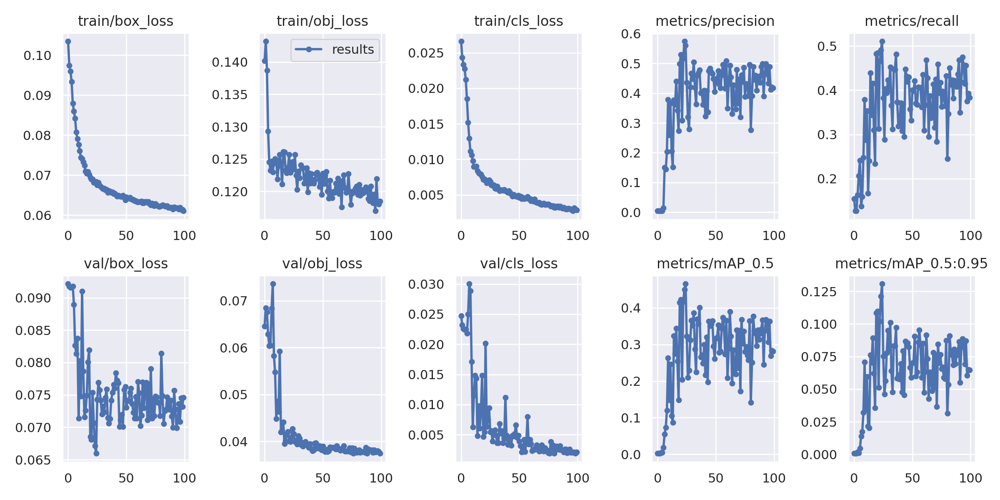

In [15]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason... 
from utils.plots import plot_results  # plot results.txt as results.png
from IPython.display import Image
Image(filename='/content/drive/MyDrive/yolo/yolov5/runs/train/yolov5m_Y5_c/results.png', width=1000)  # view results.png

### Curious? Visualize Our Training Data with Labels

After training starts, view `train*.jpg` images to see training images, labels and augmentation effects.

Note a mosaic dataloader is used for training (shown below), a new dataloading concept developed by Glenn Jocher and first featured in [YOLOv4](https://arxiv.org/abs/2004.10934).

In [2]:
!pwd
!ls

/kaggle/working
__notebook_source__.ipynb


In [ ]:
mydir_='/content/drive/MyDrive/yolo/'

In [ ]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/drive/MyDrive/yolo/yolov5/runs/train/yolov5s_results/val_batch0_labels.jpg', width=900)

In [ ]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename=mydir_+'yolov5/runs/train/yolov5s_results/train_batch0.jpg', width=900)

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [ ]:
# trained weights are saved by default in our weights folder
%ls runs/

train/


In [ ]:
%ls runs/train/yolov5s_results/weights

best.pt  last.pt


In [ ]:

/content/drive/MyDrive/yolo/yolov5/worms-2/test/images

In [ ]:
!pwd

/content/drive/MyDrive/yolo/yolov5


In [ ]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
%cd /content/drive/MyDrive/yolo/yolov5/
!python detect1.py --weights runs/train/yolov5s_results/weights/best.pt --img 384 384 --conf 0.5 --source test --save-txt

/content/drive/MyDrive/yolo/yolov5

detect1: weights=['runs/train/yolov5s_results/weights/best.pt'], source=test, data=data/coco128.yaml, imgsz=[384, 384], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False

requirements: ipython not found and is required by YOLOv5, attempting auto-update...

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/




















requirements: 1 package updated per /content/drive/MyDrive/yolo/yolov5/requirements.txt

requirements: ⚠️ Restart runtime or rerun command for updates to take effect



YOLOv5 🚀 v6.1-306-gfbe67e4 Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)



Fusing layers... 

custom_YOLOv5s summary

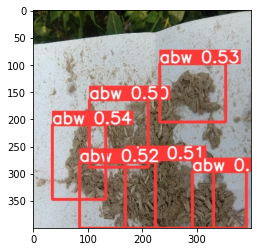

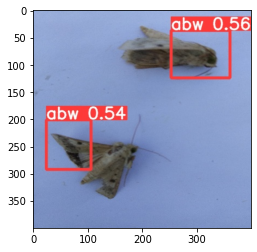

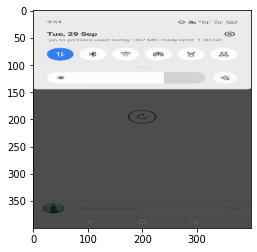

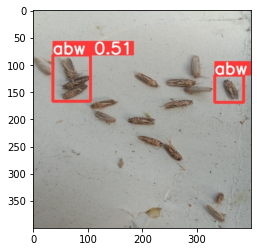

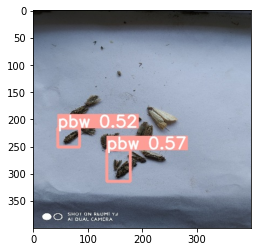

...

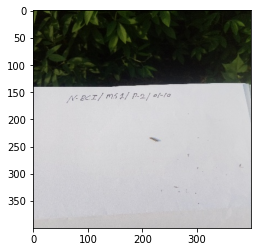

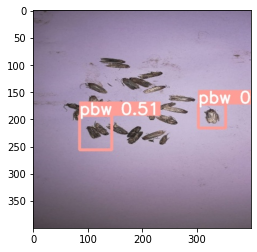

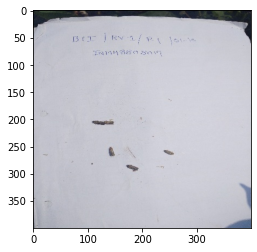

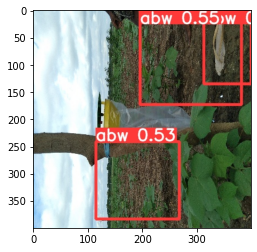

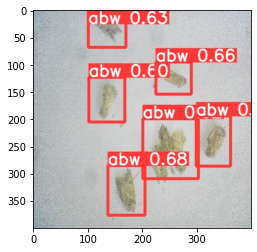

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
from numpy import asarray
dir='/content/drive/MyDrive/yolo/yolov5/runs/detect/exp12'
count=0
for img in os.listdir(dir):
  count+=1
  if(count>1):
    img_path=os.path.join(dir,img)
    img = cv2.imread(img_path)
    img =asarray(img)
  #img_array=cv2.imread(img_path)
  #Image(filename=img_path, width=900)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
  #plt.imshow(img)
    plt.show()
  if(count==25):
    break
  #print(img_path)


In [ ]:
import os
import pandas as pd
ac=0
pc=0
abw=[]
pbw=[]
file=[]
tr=[]
DIRECTORY='/content/drive/MyDrive/yolo/yolov5/runs/detect/exp12/labels'
for txt in os.listdir(DIRECTORY):
    temp=txt.split("jpg")
    temp=temp[0].split('.')
    temp=temp[0]+'_'
    print(temp)
    #break
    ac=0
    pc=0
    txt_path=os.path.join(DIRECTORY,txt)
    with open(txt_path) as f:
        lines = f.readlines()

    for line in lines:
        tokens = line.split()
        if(tokens[0]=='0'):
            ac=ac+1
            #file.append(temp+'abw')
        if(tokens[0]=='1'):
            pc=pc+1

#     for token in tokens:
#         print (token)
    print("ac=",ac,"pc=",pc)
    abw.append(ac)
    file.append(temp+'abw')
    tr.append(ac)
    pbw.append(pc)
    file.append(temp+'pbw')
    tr.append(pc)
#print(abw,pbw,file)

id_77c16957258a1e45596ff000_

ac= 0 pc= 1

id_77cf3bf548632da5997a73db_

ac= 7 pc= 0

id_78209d5e102cfa4200d8a6d4_

ac= 1 pc= 0

id_783c79c0a2acb9efb4b389a3_

ac= 1 pc= 0

id_783fb1b0ac2e7e755d75c378_

ac= 1 pc= 1

id_7840d1f260eac3f5f04a7ebe_

ac= 1 pc= 0

id_7845f1f55c882c204f503526_

ac= 5 pc= 0

id_7848d43cbba3e498223bb170_

ac= 0 pc= 1

id_787bd0f1c10c5822ecb357b8_

ac= 0 pc= 1

id_788134acbb9759d2645cb562_

ac= 1 pc= 0

id_78846d9c33a8ba8a6ae06d31_

ac= 3 pc= 0

id_78882605e03d6e9cd8cd9c4d_

ac= 0 pc= 1

id_788e082128c159e179bad939_

ac= 7 pc= 0

id_78c79994c0fc9a2b4ccde17a_

ac= 0 pc= 2

id_78e4bb27981f059a67d341ef_

ac= 1 pc= 0

id_78e5361f31a495b8fbdcfd3d_

ac= 0 pc= 5

id_78f985c6fc9fc5a47e9a587c_

ac= 3 pc= 0

id_78ffc9806fba36f9f88ec684_

ac= 0 pc= 3

id_792516d008dfd16046856abd_

ac= 0 pc= 4

id_79359b228a9d08f812ca6ac3_

ac= 0 pc= 2

id_797e993e6390e8384d093a3b_

ac= 0 pc= 1

id_79c09930a9abce7a24156cd1_

ac= 1 pc= 1

id_79c5dc2df11eca6d02185440_

ac= 0 pc= 3

id_7a080a98

In [ ]:
dftemp = pd.DataFrame({'image_id_worm':file,'number_of_worms':tr})
dftemp.head(8)

,image_id_worm,number_of_worms
0,id_77c16957258a1e45596ff000_abw,0
1,id_77c16957258a1e45596ff000_pbw,1
2,id_77cf3bf548632da5997a73db_abw,7
3,id_77cf3bf548632da5997a73db_pbw,0
4,id_78209d5e102cfa4200d8a6d4_abw,1
5,id_78209d5e102cfa4200d8a6d4_pbw,0
6,id_783c79c0a2acb9efb4b389a3_abw,1
7,id_783c79c0a2acb9efb4b389a3_pbw,0


In [ ]:
dftemp.shape

(3764, 2)

In [ ]:
dftemp.to_csv('miniS1.csv',index=False)

In [ ]:
!ls

drive  miniS.csv  sample_data


In [ ]:
#display inference on ALL test images
#this looks much better with longer training above

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/drive/MyDrive/yolo/yolov5/runs/detect/exp2/*.jpg'): #assuming JPG
    Image(filename=imageName, width=900)
    print(imageName)
    print("\n")

/content/drive/MyDrive/yolo/yolov5/runs/detect/exp2/id_0cbd3c1df98e20fff21138c2_jpg.rf.9fca155f85640912370a147f86a772f1.jpg





/content/drive/MyDrive/yolo/yolov5/runs/detect/exp2/id_0e1285fbed1c0e6bb56f1149_jpg.rf.f8128157a3043723e4b65c444eff9187.jpg





/content/drive/MyDrive/yolo/yolov5/runs/detect/exp2/id_0e90ec108f4c5a7d303eeb0a_jpg.rf.2f5874f034137682019afff14ffcc018.jpg





/content/drive/MyDrive/yolo/yolov5/runs/detect/exp2/id_3a70ed45afbbb4f9faf84461_jpg.rf.862197043418669489e64394c7a971f1.jpg





/content/drive/MyDrive/yolo/yolov5/runs/detect/exp2/id_ee5660971f92923dbbc35f53_jpg.rf.b5aa16943aa27e18170bc56ab8ea15fe.jpg






In [ ]:
print(imageName)

/content/drive/MyDrive/yolo/yolov5/runs/detect/exp2/id_ee5660971f92923dbbc35f53_jpg.rf.b5aa16943aa27e18170bc56ab8ea15fe.jpg


In [ ]:
!python export.py --weights yolov5s.pt --include engine --imgsz 384 --device 0  # export

export: data=data/coco128.yaml, weights=['yolov5s.pt'], imgsz=[384], batch_size=1, device=0, half=False, inplace=False, train=False, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=12, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['engine']

YOLOv5 🚀 v6.1-306-gfbe67e4 Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)




100% 14.1M/14.1M [00:01<00:00, 10.7MB/s]



Fusing layers... 

YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients



PyTorch: starting from yolov5s.pt with output shape (1, 9072, 85) (14.1 MB)

requirements: nvidia-tensorrt not found and is required by YOLOv5, attempting auto-update...

Looking in indexes: https://pypi.ngc.nvidia.com, https://us-python.pkg.dev/colab-wheels/public/simple/




















  Created wheel for nvidia-cublas-cu11: filename=nvidia_cublas_cu11-2022.4.8-py3-none-any.whl size=15625 sha256=4d215b2f806a6d

# Export Trained Weights for Future Inference

Now that you have trained your custom detector, you can export the trained weights you have made here for inference on your device elsewhere

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
%cp /content/yolov5/runs/train/yolov5s_results/weights/best.pt /content/gdrive/My\ Drive

## Congrats!

Hope you enjoyed this!

--Team [Roboflow](https://roboflow.ai)